<a href="https://colab.research.google.com/github/katduecker/dnn_osci/blob/main/Thesis_ch3_two_layer_too_perfect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
rm -r dnn_osci     # delete old version in drive

rm: cannot remove 'dnn_osci': No such file or directory


In [2]:
!git clone https://github.com/katduecker/dnn_osci
%cd dnn_osci
%cd aet_pytorch/

Cloning into 'dnn_osci'...
remote: Enumerating objects: 558, done.
remote: Counting objects: 100% (145/145), done.
remote: Compressing objects: 100% (130/130), done.
remote: Total 558 (delta 76), reused 27 (delta 15), pack-reused 413
Receiving objects: 100% (558/558), 90.50 MiB | 14.66 MiB/s, done.
Resolving deltas: 100% (294/294), done.
/content/dnn_osci
/content/dnn_osci/aet_pytorch


In [3]:
# AETZ model replication using pytorch

import torch
from torch import nn
import numpy as np


import aet_net_2lay
import aet_dyn
# get CUDA index
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
# colours for plot
col = mcolors.TABLEAU_COLORS

from itertools import combinations


plt.rcParams["figure.figsize"] = (18,3)

font = {'weight' : 'normal',
        'size'   : 14,
        'family' : 'sans-serif'}
plt.rc('font',**font)


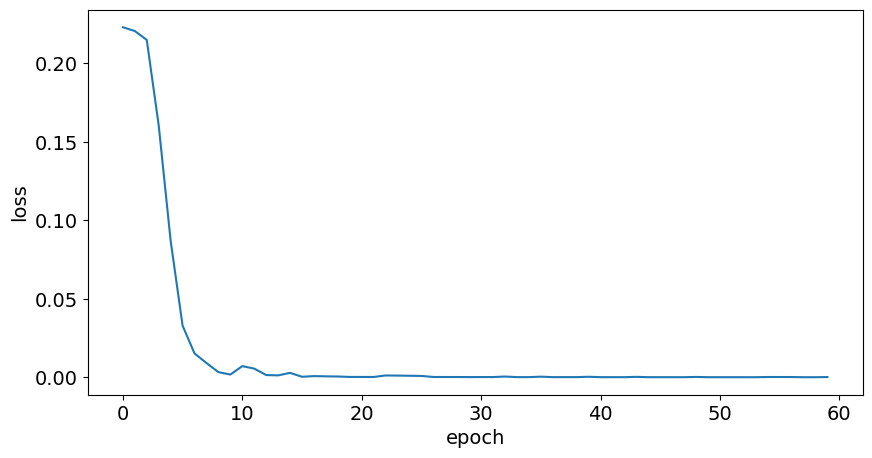

In [4]:
nn_dim_ = [28,64,32,3]   # [quadrant size, number of hidden nodes, number of output nodes]
eta_ = 1e-3           # learning rate
mini_sz_ = 1          # mini batch size (1 = use SGD)
num_epo_ = 60

beta_ = 0
p_ = .02              # has to be != 0 even if not used
kl_reg_ = [beta_,p_,1]#[0,0.001] # sparsity constraint parameters (not used for manual model)
sig_param =[[2, -2.5, False],[2, -2.5, False]] # sigmoid slope and shift in x direction

ortho_lmbda = 0
ortho_layer = 1

# loss function & final layer activation (for binary crossentropy use sigmoid)
lossfun = [nn.MSELoss(), nn.Softmax(dim=-1)]

params = nn_dim_,eta_,mini_sz_,num_epo_,kl_reg_,sig_param,ortho_lmbda,ortho_layer

# initialize model and weights
model = aet_net_2lay.net(params,lossfun)
model = aet_net_2lay.init_params(model,weight_init='uni')

optimizer = torch.optim.Adam(model.parameters(),lr=eta_)

model.to(DEVICE)
loss_hist = model.train(optimizer,noise=False,print_loss=False)


plt.rcParams["figure.figsize"] = (10,5)
plt.plot(np.arange(model.num_ep),loss_hist.cpu().detach().numpy());
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()


In [5]:
# create stimuli
x_train, y_train = aet_net_2lay.aet_stim.mkstim()
x_train = x_train.to(DEVICE)
y_train = y_train.to(DEVICE)

In [6]:
Z,H1,H2,O = model.forw_conv(x_train)

torch.max(Z)

tensor(7.3522, grad_fn=<MaxBackward1>)

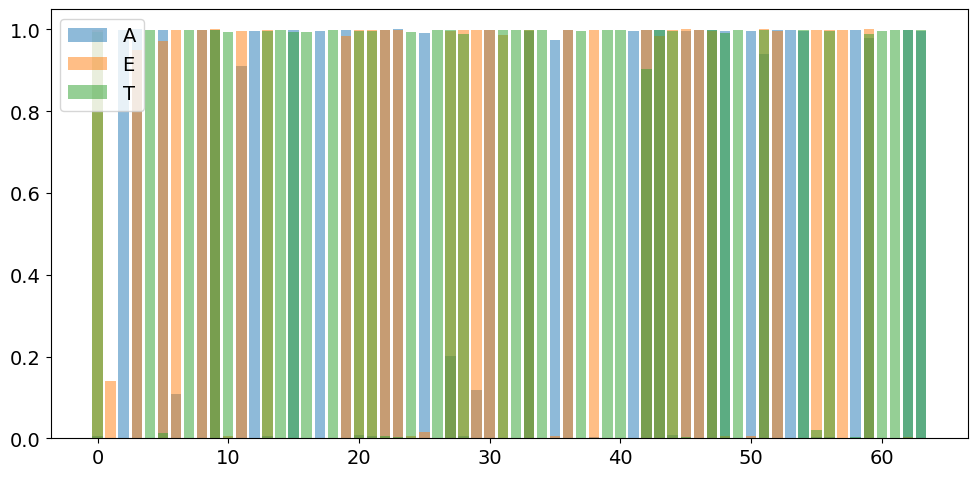

In [7]:
idx = np.array((0,4,8))
label = ['A','E','T']
fig, axs = plt.subplots()
for i,ii in enumerate(idx):
  axs.bar(np.arange(nn_dim_[1]),H1[ii].detach().cpu().numpy(),alpha=0.5)

axs.legend(label)

fig.tight_layout()

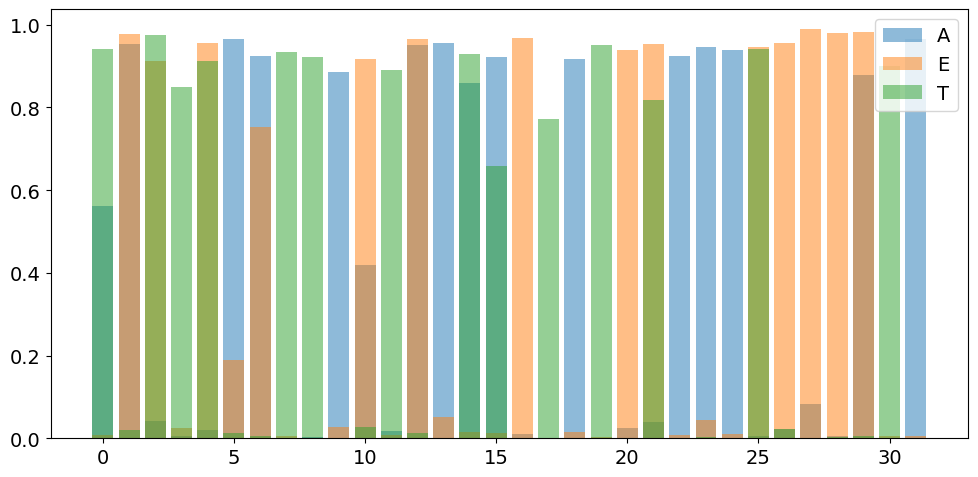

In [8]:
idx = np.array((0,4,8))
label = ['A','E','T']
fig, axs = plt.subplots()
for i,ii in enumerate(idx):
  axs.bar(np.arange(nn_dim_[2]),H2[ii].detach().cpu().numpy(),alpha=0.5)

axs.legend(label)

fig.tight_layout()

In [31]:
def euler_dyn(model,input_,params_,t_,alpha_params,DEVICE,inp_on):

    # inputs:
        # input_: input image
        # params_: hyperparameters
        # t_: time vector for integration
        # alpha_params: alpha frequency & amplitude

    # discretization & dynamics parameters
    tau_h,tau_R,c,S,h_start,R_start = params_


    # alpha frequency & amplitude
    _af,_aa,_aph = alpha_params


    with torch.no_grad():

        # initialize empty matrices
        dt = np.diff(t_)[0]
        dh1dt = (torch.ones((model.dims[1],len(t_)+1))*h_start).to(DEVICE)
        dR1dt = (torch.ones((model.dims[1],len(t_)+1))*R_start).to(DEVICE)

        dh2dt = (torch.ones((model.dims[2],len(t_)+1))*h_start).to(DEVICE)
        dR2dt = (torch.ones((model.dims[2],len(t_)+1))*R_start).to(DEVICE)

        dOdt = (torch.zeros((model.dims[3],len(t_)+1))).to(DEVICE)
        dZdt = (torch.zeros((model.dims[1],len(t_)+1))).to(DEVICE)
        dZ2dt = (torch.ones((model.dims[2],len(t_)+1))*h_start).to(DEVICE)

        # alpha inhibition
        alpha_inh1 = _aa[0]*np.sin(2*np.pi*_af[0]*t_+_aph[0])+_aa[0]
        alpha_inh2 = _aa[1]*np.sin(2*np.pi*_af[1]*t_+_aph[0])+_aa[1]


        # preactivation (dot product of input and first weight matrix)
        Z,H1,_,_= model.forw_conv(input_)

        # create boxcar function to try different input onsets
        boxcar = np.zeros_like(t_)
        boxcar[inp_on:] = 1

        # adjust initial adaptation term (threshold)
        dR1dt *= torch.max(Z)

        # scale for adaptation
        #r_scale = R*torch.max(Z).detach()


        for _it,t in enumerate(t_):

            # dynamic input: multiply input with boxcar
            Z,H1,H2,O = model.forw_conv(input_*boxcar[_it])

          # pre-activation
            dZdt[:,_it+1] = (Z + dh1dt[:,_it] - dR1dt[:,_it] - alpha_inh1[_it])/(abs(S[0]/Z))

            # dynamics hidden layer
            dh1dt[:,_it+1] = dh1dt[:,_it] + dt/tau_h * (-dh1dt[:,_it] + model.acti1(dZdt[:,_it+1],model.sig_param[0]))

            # adaptation term
            dR1dt[:,_it+1] = dR1dt[:,_it] + dt/tau_R * (-dR1dt[:,_it] + c[0]*dh1dt[:,_it+1])


            # pre-activation layer 2
            Z2 =  model.fc1(H1)

            dZ2dt[:,_it+1] = (model.fc1(dh1dt[:,_it+1]) + dh2dt[:,_it+1] - dR2dt[:,_it]- alpha_inh2[_it])/abs(S[1]/Z2)
            # dynamics hidden layer1
            dh2dt[:,_it+1] = dh2dt[:,_it] + dt/tau_h * (-dh2dt[:,_it] + aet_net_2lay.sigmoid(dZ2dt[:,_it+1],model.sig_param[1]))

            # # adaptation term 2
            dR2dt[:,_it+1] = dR2dt[:,_it] + dt/tau_R * (-dR2dt[:,_it] + c[1]*dh2dt[:,_it+1])

            # output layer
            dOdt[:,_it+1] = model.actiout(model.fc2(dh2dt[:,_it+1]))

    return dZdt, dZ2dt, dh1dt, dR1dt, dh2dt, dR2dt,dOdt



In [41]:
Z,H1,H2,O = model.forw_conv(x_train)
Z2 = model.fc1(H1)

tau_h = 0.01
tau_r = 0.1
c = [11,11]
S = [torch.max(Z)*0.1,torch.max(Z2)*0.1]

h_start = 0
R_start = 1
dyn_params = [tau_h,tau_r,c,S,h_start,R_start]   # [tau_h, tau_r, r_scale factor, T, h start, R start]

# dynamics alpha

alpha_params = [[10,10],[0,0],[0,0]]
_io = 100

timevec = np.linspace(0,0.6,600)

Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,x_train[0], dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)



In [18]:
Z,H1,H2,O = model.forw_conv(x_train[0])

((Z-H1t[:,1] - 0.1) / (S[0]/Z)).shape

torch.Size([64])

# **`Dynamic Output`**

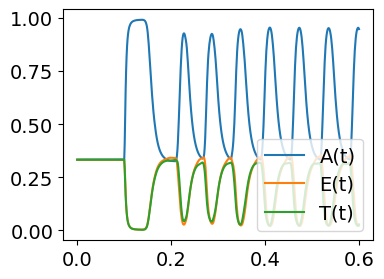

In [42]:
plt.rcParams["figure.figsize"] = (4,3)

plt.plot(timevec,Ot[:,1:].T)
plt.legend(('A(t)','E(t)','T(t)'),loc='lower right')

## Dynamic activations L1

In [43]:
Z, H1, H2, O = model.forw_conv(x_train[0])
Z = Z.detach().cpu().numpy()
H1 = H1.detach().cpu().numpy()
H2 = H2.detach().cpu().numpy()
O = O.detach().cpu().numpy()

In [ ]:



# plt.rcParams["figure.figsize"] = (24,120)

# fig, axs = plt.subplots(Z1t.shape[0],4)

# t = 0

# for i,z in enumerate(np.argsort(Z)):
#   axs[i,0].plot(timevec[t:],Z1t[z,t+1:])
#   axs[i,0].set_yticks((-Z[z],0,Z[z]))
#   axs[i,0].set_ylabel('Z')
#   axs[i,1].plot(timevec[t:],H1t[z,t+1:])

#   #if aamp:
#     #[i,1].plot(timevec[t:],0.5*np.sin(2*np.pi*afreq*timevec[t:]+aph)+0.5,color = 'k',linestyle='-.')
#   axs[i,1].fill_between(timevec[t:], np.tile(0,timevec[t:].shape[0]), np.tile(H1[z],timevec[t:].shape[0]), alpha=0.15, color=[0, 0, 0])
#   axs[i,1].set_ylabel('H')

#   axs[i,1].set_ylim(0,1)
#   axs[i,2].plot(R1t[z,t+1:],H1t[z,t+1:])
#   axs[i,2].set_ylim(0,1)
#   axs[i,2].set_xlabel('R')
#   axs[i,2].set_ylabel('H')

#   dH = np.diff(H1t[z])

#   mark_sign_chan = np.array(())
#   for h in range(dH.shape[0]-1):
#     if (np.sign(dH[h])+np.sign(dH[h+1])) == 0:
#       mark_sign_chan = np.append(mark_sign_chan,h)

#   axs[i,3].plot(R1t[z,t+1:],dH)
#   axs[i,3].plot(R1t[z,(t+1+mark_sign_chan).astype(int)],dH[(t+mark_sign_chan).astype(int)],'d')
#   axs[i,3].set_xlabel('R')
#   axs[i,3].set_ylabel('dH')


# fig.tight_layout()

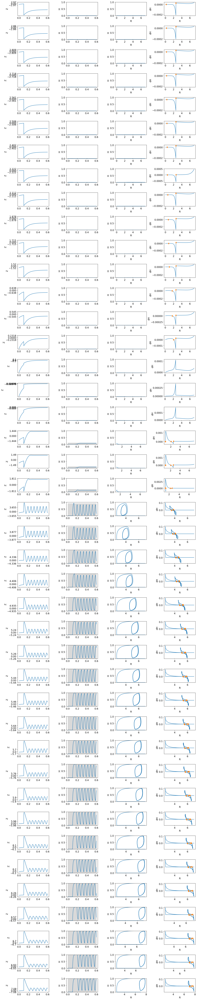

In [44]:
# better image - only show unique Z's
Z_round = np.round(Z,decimals=1)
Z_round_idx = np.argsort(Z_round)
Z_round_sort = np.sort(Z_round)
Z_round_unique_idx = np.unique(Z_round_sort,return_index=True)

plt.rcParams["figure.figsize"] = (16,80)

fig, axs = plt.subplots(Z_round_unique_idx[1].shape[0],4)

t = 0

for i,z in enumerate(Z_round_unique_idx[1]):
  axs[i,0].plot(timevec[t:],Z1t[Z_round_idx[z],t+1:])
  axs[i,0].set_yticks((-Z[Z_round_idx[z]],0,Z[Z_round_idx[z]]))
  axs[i,0].set_ylabel('Z')
  axs[i,1].plot(timevec[t:],H1t[Z_round_idx[z],t+1:])

#if aamp:
   # axs[i,1].plot(timevec[t:],0.5*np.sin(2*np.pi*afreq*timevec[t:]+aph)+0.5,color = 'k',linestyle='-.')
  axs[i,1].fill_between(timevec[t:], np.tile(0,timevec[t:].shape[0]), np.tile(H1[Z_round_idx[z]],timevec[t:].shape[0]), alpha=0.15, color=[0, 0, 0])
  axs[i,1].set_ylabel('H')

  axs[i,1].set_ylim(0,1)
  axs[i,2].plot(R1t[Z_round_idx[z],t+1:],H1t[Z_round_idx[z],t+1:])
  axs[i,2].set_ylim(0,1)
  axs[i,2].set_xlabel('R')
  axs[i,2].set_ylabel('H')

  dH = np.diff(H1t[Z_round_idx[z]])

  mark_sign_chan = np.array(())
  for h in range(dH.shape[0]-1):
    if (np.sign(dH[h])+np.sign(dH[h+1])) == 0:
      mark_sign_chan = np.append(mark_sign_chan,h)

  axs[i,3].plot(R1t[Z_round_idx[z],t+1:],dH)
  axs[i,3].plot(R1t[Z_round_idx[z],(t+1+mark_sign_chan).astype(int)],dH[(t+mark_sign_chan).astype(int)],'d')
  axs[i,3].set_xlabel('R')
  axs[i,3].set_ylabel('dH')


fig.tight_layout()


## Dynamic activations L2

In [45]:
Z, H1, H2, O = model.forw_conv(x_train[0])
Z2 = model.fc1(H1)


Z = Z.detach().cpu().numpy()
Z2 = Z2.detach().cpu().numpy()
H1 = H1.detach().cpu().numpy()
H2 = H2.detach().cpu().numpy()
O = O.detach().cpu().numpy()

In [ ]:


# plt.rcParams["figure.figsize"] = (24,60)

# fig, axs = plt.subplots(Z2t.shape[0],4)

# t = 0

# for i,z in enumerate(np.argsort(Z2)):
#   axs[i,0].plot(timevec[t:],Z2t[z,t+1:])
#   axs[i,0].set_yticks((-Z2[z],0,Z2[z]))
#   axs[i,0].set_ylabel('Z')
#   axs[i,1].plot(timevec[t:],H2t[z,t+1:])

#   #if aamp:
#     #[i,1].plot(timevec[t:],0.5*np.sin(2*np.pi*afreq*timevec[t:]+aph)+0.5,color = 'k',linestyle='-.')
#   axs[i,1].fill_between(timevec[t:], np.tile(0,timevec[t:].shape[0]), np.tile(H2[z],timevec[t:].shape[0]), alpha=0.15, color=[0, 0, 0])
#   axs[i,1].set_ylabel('H')

#   axs[i,1].set_ylim(0,1)
#   axs[i,2].plot(R2t[z,t+1:],H2t[z,t+1:])
#   axs[i,2].set_ylim(0,1)
#   axs[i,2].set_xlabel('R')
#   axs[i,2].set_ylabel('H')

#   dH = np.diff(H2t[z])

#   mark_sign_chan = np.array(())
#   for h in range(dH.shape[0]-1):
#     if (np.sign(dH[h])+np.sign(dH[h+1])) == 0:
#       mark_sign_chan = np.append(mark_sign_chan,h)

#   axs[i,3].plot(R2t[z,t+1:],dH)
#   axs[i,3].plot(R2t[z,(t+1+mark_sign_chan).astype(int)],dH[(t+mark_sign_chan).astype(int)],'d')
#   axs[i,3].set_xlabel('R')
#   axs[i,3].set_ylabel('dH')


# fig.tight_layout()

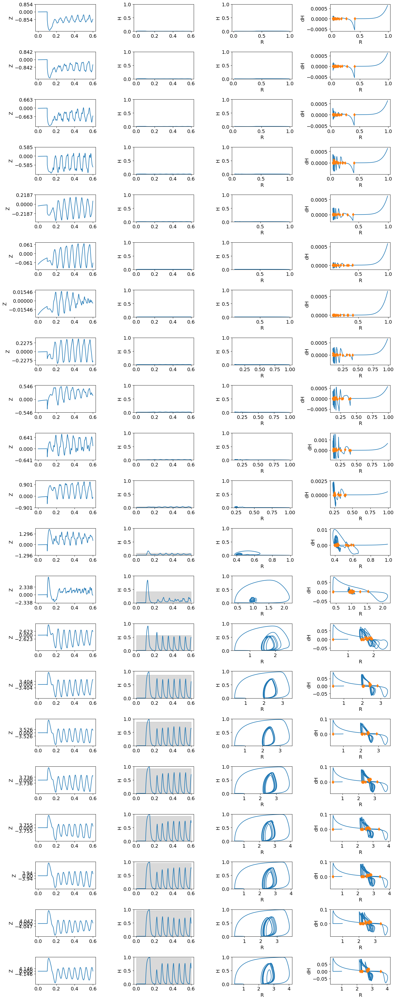

In [46]:
# better image - only show unique Z's
Z_round = np.round(Z2,decimals=1)
Z_round_idx = np.argsort(Z_round)
Z_round_sort = np.sort(Z_round)
Z_round_unique_idx = np.unique(Z_round_sort,return_index=True)

plt.rcParams["figure.figsize"] = (16,40)

fig, axs = plt.subplots(Z_round_unique_idx[1].shape[0],4)

t = 0

for i,z in enumerate(Z_round_unique_idx[1]):
  axs[i,0].plot(timevec[t:],Z2t[Z_round_idx[z],t+1:])
  axs[i,0].set_yticks((-Z2[Z_round_idx[z]],0,Z2[Z_round_idx[z]]))
  axs[i,0].set_ylabel('Z')
  axs[i,1].plot(timevec[t:],H2t[Z_round_idx[z],t+1:])

#if aamp:
   # axs[i,1].plot(timevec[t:],0.5*np.sin(2*np.pi*afreq*timevec[t:]+aph)+0.5,color = 'k',linestyle='-.')
  axs[i,1].fill_between(timevec[t:], np.tile(0,timevec[t:].shape[0]), np.tile(H2[Z_round_idx[z]],timevec[t:].shape[0]), alpha=0.15, color=[0, 0, 0])
  axs[i,1].set_ylabel('H')

  axs[i,1].set_ylim(0,1)
  axs[i,2].plot(R2t[Z_round_idx[z],t+1:],H2t[Z_round_idx[z],t+1:])
  axs[i,2].set_ylim(0,1)
  axs[i,2].set_xlabel('R')
  axs[i,2].set_ylabel('H')

  dH = np.diff(H2t[Z_round_idx[z]])

  mark_sign_chan = np.array(())
  for h in range(dH.shape[0]-1):
    if (np.sign(dH[h])+np.sign(dH[h+1])) == 0:
      mark_sign_chan = np.append(mark_sign_chan,h)

  axs[i,3].plot(R2t[Z_round_idx[z],t+1:],dH)
  axs[i,3].plot(R2t[Z_round_idx[z],(t+1+mark_sign_chan).astype(int)],dH[(t+mark_sign_chan).astype(int)],'d')
  axs[i,3].set_xlabel('R')
  axs[i,3].set_ylabel('dH')


fig.tight_layout()

# **Entrainment**


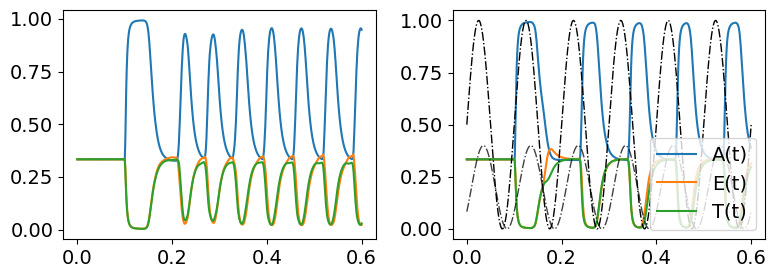

In [48]:
alpha_params = [[10,10],[.5,.2],[0,-2*np.pi/10]]
_io = 100

timevec = np.linspace(0,0.6,600)

Z1t,Z2t,H1t,R1t,H2t,R2t, Ot_new  = euler_dyn(model,x_train[0], dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)


plt.rcParams["figure.figsize"] = (8,3)

fig,axs = plt.subplots(1,2)
axs[0].plot(timevec,Ot[:,1:].T)

axs[1].plot(timevec,Ot_new[:,1:].T)
if alpha_params[1][0]:
    axs[1].plot(timevec[t:],alpha_params[1][0]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][0])+alpha_params[1][0],color = 'k',linestyle='-.',linewidth=1)

if alpha_params[1][1]:
    axs[1].plot(timevec[t:],alpha_params[1][1]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][1])+alpha_params[1][1],color = 'k',linestyle='-.',linewidth=1,alpha=0.75)



plt.legend(('A(t)','E(t)','T(t)'),loc='lower right')

fig.tight_layout()

# Layer 1

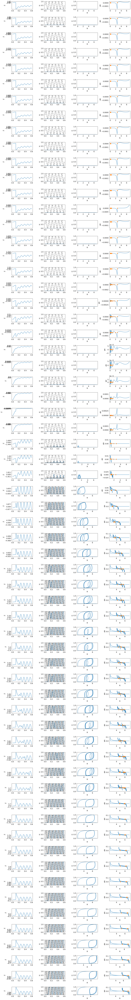

In [50]:

Z, H1, H2, O = model.forw_conv(x_train[0])
Z = Z.detach().cpu().numpy()
H1 = H1.detach().cpu().numpy()
H2 = H2.detach().cpu().numpy()
O = O.detach().cpu().numpy()


plt.rcParams["figure.figsize"] = (16,120)

fig, axs = plt.subplots(Z1t.shape[0],4)

t = 0

for i,z in enumerate(np.argsort(Z)):
  axs[i,0].plot(timevec[t:],Z1t[z,t+1:])
  axs[i,0].set_yticks((-Z[z],0,Z[z]))
  axs[i,0].set_ylabel('Z')
  axs[i,1].plot(timevec[t:],H1t[z,t+1:])

  if alpha_params[1][0]:
     axs[i,1].plot(timevec[t:],0.5*np.sin(2*np.pi*alpha_params[0][0]*timevec[t:]+alpha_params[2][0])+0.5,color = 'k',linestyle='-.')
  axs[i,1].fill_between(timevec[t:], np.tile(0,timevec[t:].shape[0]), np.tile(H1[z],timevec[t:].shape[0]), alpha=0.15, color=[0, 0, 0])
  axs[i,1].set_ylabel('H')

  axs[i,1].set_ylim(0,1)
  axs[i,2].plot(R1t[z,t+1:],H1t[z,t+1:])
  axs[i,2].set_ylim(0,1)
  axs[i,2].set_xlabel('R')
  axs[i,2].set_ylabel('H')

  dH = np.diff(H1t[z])

  mark_sign_chan = np.array(())
  for h in range(dH.shape[0]-1):
    if (np.sign(dH[h])+np.sign(dH[h+1])) == 0:
      mark_sign_chan = np.append(mark_sign_chan,h)

  axs[i,3].plot(R1t[z,t+1:],dH)
  axs[i,3].plot(R1t[z,(t+1+mark_sign_chan).astype(int)],dH[(t+mark_sign_chan).astype(int)],'d')
  axs[i,3].set_xlabel('R')
  axs[i,3].set_ylabel('dH')


fig.tight_layout()

# Layer 2

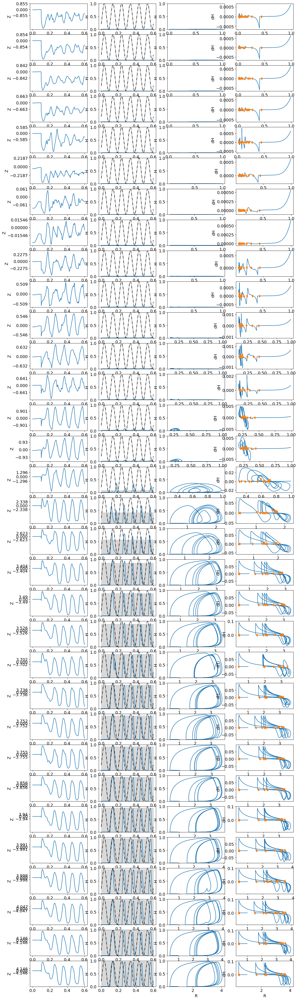

In [51]:
Z, H1, H2, O = model.forw_conv(x_train[0])
Z2 = model.fc1(H1)


Z = Z.detach().cpu().numpy()
Z2 = Z2.detach().cpu().numpy()
H1 = H1.detach().cpu().numpy()
H2 = H2.detach().cpu().numpy()
O = O.detach().cpu().numpy()

plt.rcParams["figure.figsize"] = (16,60)

fig, axs = plt.subplots(Z2t.shape[0],4)

t = 0

for i,z in enumerate(np.argsort(Z2)):
  axs[i,0].plot(timevec[t:],Z2t[z,t+1:])
  axs[i,0].set_yticks((-Z2[z],0,Z2[z]))
  axs[i,0].set_ylabel('Z')
  axs[i,1].plot(timevec[t:],H2t[z,t+1:])

  if alpha_params[1][1]:
     axs[i,1].plot(timevec[t:],0.5*np.sin(2*np.pi*alpha_params[0][1]*timevec[t:]+alpha_params[2][1])+0.5,color = 'k',linestyle='-.')

  axs[i,1].fill_between(timevec[t:], np.tile(0,timevec[t:].shape[0]), np.tile(H2[z],timevec[t:].shape[0]), alpha=0.15, color=[0, 0, 0])
  axs[i,1].set_ylabel('H')

  axs[i,1].set_ylim(0,1)
  axs[i,2].plot(R2t[z,t+1:],H2t[z,t+1:])
  axs[i,2].set_ylim(0,1)
  axs[i,2].set_xlabel('R')
  axs[i,2].set_ylabel('H')

  dH = np.diff(H2t[z])

  mark_sign_chan = np.array(())
  for h in range(dH.shape[0]-1):
    if (np.sign(dH[h])+np.sign(dH[h+1])) == 0:
      mark_sign_chan = np.append(mark_sign_chan,h)

  axs[i,3].plot(R2t[z,t+1:],dH)
  axs[i,3].plot(R2t[z,(t+1+mark_sign_chan).astype(int)],dH[(t+mark_sign_chan).astype(int)],'d')
  axs[i,3].set_xlabel('R')
  axs[i,3].set_ylabel('dH')


# **Temporal Code**

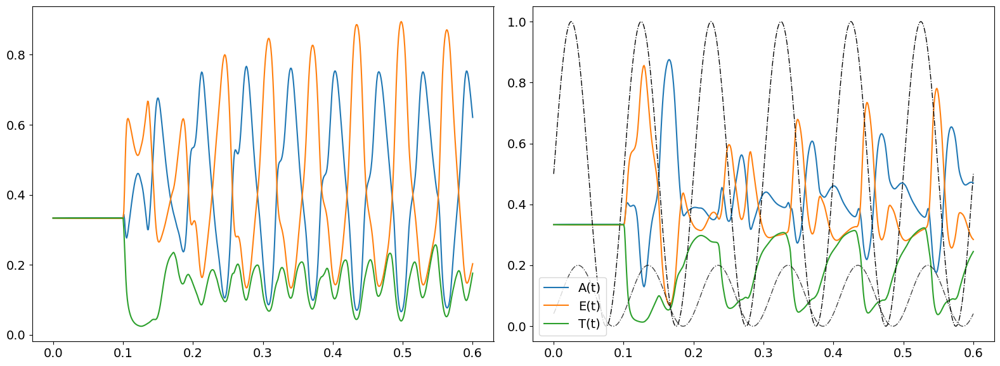

In [52]:

inpt = x_train[1]*1.1 + x_train[5]*0.9

plt.rcParams["figure.figsize"] = (16,6)

alpha_params = [[10,10],[0,0],[0,-2*np.pi/10]]

Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,inpt, dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)


fig,axs = plt.subplots(1,2)
axs[0].plot(timevec,Ot[:,1:].T)



alpha_params = [[10,10],[0.5,0.1],[0,-2*np.pi/10]]
_io = 100

Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,inpt, dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)


axs[1].plot(timevec,Ot[:,1:].T)
if alpha_params[1][0]:
    axs[1].plot(timevec[t:],alpha_params[1][0]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][0])+alpha_params[1][0],color = 'k',linestyle='-.',linewidth=1)

if alpha_params[1][1]:
    axs[1].plot(timevec[t:],alpha_params[1][1]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][1])+alpha_params[1][1],color = 'k',linestyle='-.',linewidth=1,alpha=0.75)



plt.legend(('A(t)','E(t)','T(t)'),loc='lower left')

fig.tight_layout()

In [53]:
idx = np.array((0,5,10))#,-1))
inp_combi = list(combinations(idx,2))           # possible combinations


labels = ['A', 'E', 'T']
label_comb = list(combinations(labels,2))
label_comb

[('A', 'E'), ('A', 'T'), ('E', 'T')]

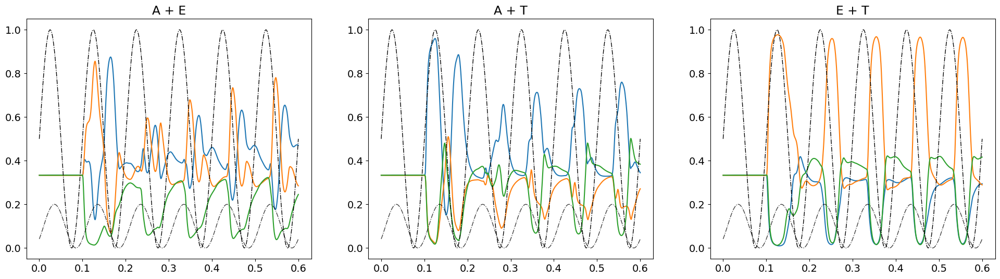

In [54]:
plt.rcParams["figure.figsize"] = (24,6)


fig,axs = plt.subplots(1,3)

for i,comp_inp in enumerate(inp_combi):

  inpt = x_train[comp_inp[0]]*1.1 + x_train[comp_inp[1]]*.9

  Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,inpt, dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)

  axs[i].plot(timevec,Ot[:,1:].T)
  if alpha_params[1][0]:
      axs[i].plot(timevec[t:],alpha_params[1][0]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][0])+alpha_params[1][0],color = 'k',linestyle='-.',linewidth=1)
  if alpha_params[1][1]:
      axs[i].plot(timevec[t:],alpha_params[1][1]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][1])+alpha_params[1][1],color = 'k',linestyle='-.',linewidth=1,alpha=0.75)

  axs[i].set_title(label_comb[i][0] + ' + ' + label_comb[i][1])

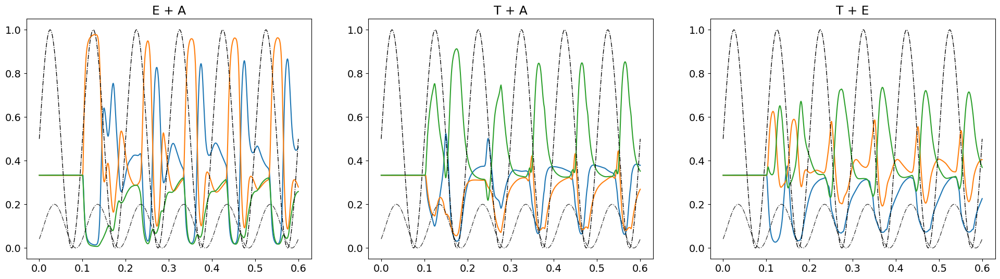

In [55]:
fig,axs = plt.subplots(1,3)

for i,comp_inp in enumerate(inp_combi):

  inpt = x_train[comp_inp[1]]*1.1 + x_train[comp_inp[0]]*.9

  Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,inpt, dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)

  axs[i].plot(timevec,Ot[:,1:].T)
  if alpha_params[1][0]:
      axs[i].plot(timevec[t:],alpha_params[1][0]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][0])+alpha_params[1][0],color = 'k',linestyle='-.',linewidth=1)
  if alpha_params[1][1]:
      axs[i].plot(timevec[t:],alpha_params[1][1]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][1])+alpha_params[1][1],color = 'k',linestyle='-.',linewidth=1,alpha=0.75)

  axs[i].set_title(label_comb[i][1] + ' + ' + label_comb[i][0])

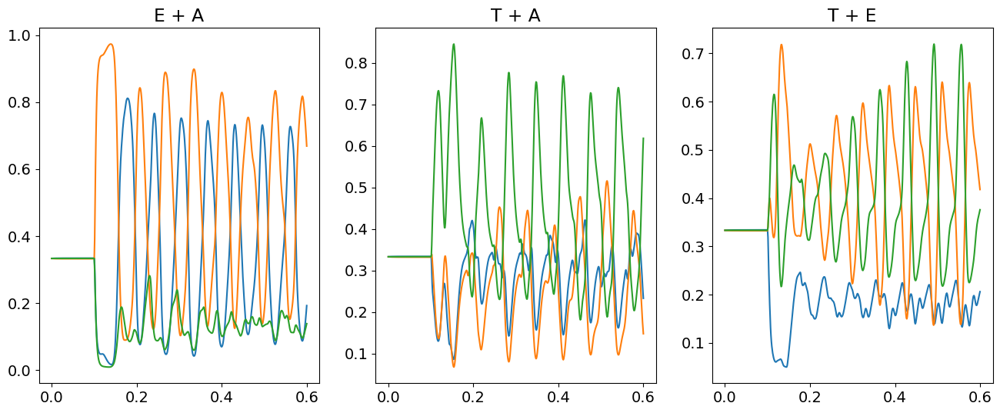

In [57]:
plt.rcParams["figure.figsize"] = (16,6)

alpha_params = [[10,10],[0,0],[0,-2*np.pi/10]]

fig,axs = plt.subplots(1,3)

for i,comp_inp in enumerate(inp_combi):

  inpt = x_train[comp_inp[1]]*1.1 + x_train[comp_inp[0]]*.9

  Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,inpt, dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)

  axs[i].plot(timevec,Ot[:,1:].T)
  if alpha_params[1][0]:
      axs[i].plot(timevec[t:],alpha_params[1][0]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][0])+alpha_params[1][0],color = 'k',linestyle='-.',linewidth=1)
  if alpha_params[1][1]:
      axs[i].plot(timevec[t:],alpha_params[1][1]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][1])+alpha_params[1][1],color = 'k',linestyle='-.',linewidth=1,alpha=0.75)

  axs[i].set_title(label_comb[i][1] + ' + ' + label_comb[i][0])

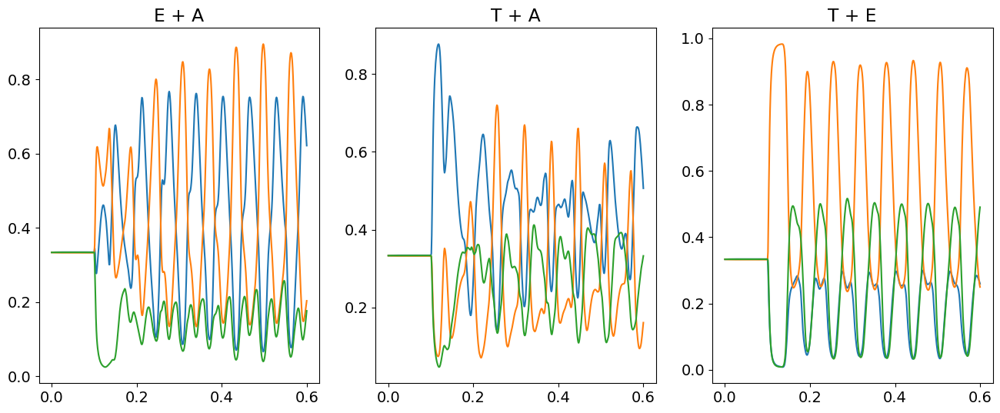

In [58]:
plt.rcParams["figure.figsize"] = (16,6)

alpha_params = [[10,10],[0,0],[0,-2*np.pi/10]]

fig,axs = plt.subplots(1,3)

for i,comp_inp in enumerate(inp_combi):

  inpt = x_train[comp_inp[0]]*1.1 + x_train[comp_inp[1]]*.9

  Z1t,Z2t,H1t,R1t,H2t,R2t, Ot  = euler_dyn(model,inpt, dyn_params, timevec, alpha_params,DEVICE,inp_on=_io)

  axs[i].plot(timevec,Ot[:,1:].T)
  if alpha_params[1][0]:
      axs[i].plot(timevec[t:],alpha_params[1][0]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][0])+alpha_params[1][0],color = 'k',linestyle='-.',linewidth=1)
  if alpha_params[1][1]:
      axs[i].plot(timevec[t:],alpha_params[1][1]*np.sin(2*np.pi*10*timevec[t:]+alpha_params[2][1])+alpha_params[1][1],color = 'k',linestyle='-.',linewidth=1,alpha=0.75)

  axs[i].set_title(label_comb[i][1] + ' + ' + label_comb[i][0])